# Assignment: Compresive Strength Concrete Problem


### Abstract: 

Concrete is the most important material in civil engineering. The concrete compressive strength (concrete strength to bear the load) is a highly nonlinear function of age and ingredients.  <br><br>

<table border="1"  cellpadding="6" bordercolor="red">
	<tbody>
        <tr>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Data Set Characteristics:&nbsp;&nbsp;</b></p></td>
		<td><p class="normal">Multivariate</p></td>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Number of Instances:</b></p></td>
		<td><p class="normal">1030</p></td>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Area:</b></p></td>
		<td><p class="normal">Physical</p></td>
        </tr>
     </tbody>
    </table>
<table border="1" cellpadding="6">
    <tbody>
        <tr>
            <td bgcolor="#DDEEFF"><p class="normal"><b>Attribute Characteristics:</b></p></td>
            <td><p class="normal">Real</p></td>
            <td bgcolor="#DDEEFF"><p class="normal"><b>Number of Attributes:</b></p></td>
            <td><p class="normal">9</p></td>
            <td bgcolor="#DDEEFF"><p class="normal"><b>Date Donated</b></p></td>
            <td><p class="normal">2007-08-03</p></td>
        </tr>
     </tbody>
    </table>
<table border="1" cellpadding="6">	
    <tbody>
    <tr>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Associated Tasks:</b></p></td>
		<td><p class="normal">Regression</p></td>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Missing Values?</b></p></td>
		<td><p class="normal">N/A</p></td>
		<td bgcolor="#DDEEFF"><p class="normal"><b>Number of Web Hits:</b></p></td>
		<td><p class="normal">231464</p></td>
	</tr>
    </tbody>
    </table>

###  Description:
| Features Name | Data Type | Measurement | Description |
| -- | -- | -- | -- |
Cement (component 1) | quantitative | kg in a m3 mixture | Input Variable
Blast Furnace Slag (component 2) | quantitative | kg in a m3 mixture | Input Variable
Fly Ash (component 3) | quantitative | kg in a m3 mixture | Input Variable
Water (component 4) | quantitative | kg in a m3 mixture | Input Variable
Superplasticizer (component 5) | quantitative | kg in a m3 mixture | Input Variable
Coarse Aggregate (component 6) | quantitative | kg in a m3 mixture | Input Variable
Fine Aggregate (component 7) | quantitative | kg in a m3 mixture | Input Variable
Age | quantitative | Day (1~365) | Input Variable
Concrete compressive strength | quantitative | MPa | Output Variable

### WORKFLOW :
- Load Data
- Check Missing Values ( If Exist ; Fill each record with mean of its feature )
- Standardized the Input Variables. **Hint**: Centeralized the data
- Split into 50% Training(Samples,Labels) , 30% Test(Samples,Labels) and 20% Validation Data(Samples,Labels).
- Model : input Layer (No. of features ), 3 hidden layers including 10,8,6 unit & Output Layer with activation function relu/tanh (check by experiment).
- Compilation Step (Note : Its a Regression problem , select loss , metrics according to it)
- Train the Model with Epochs (100) and validate it
- If the model gets overfit tune your model by changing the units , No. of layers , activation function , epochs , add dropout layer or add Regularizer according to the need .
- Evaluation Step
- Prediction


# Load Data:
[Click Here to Download DataSet](https://github.com/ramsha275/ML_Datasets/blob/main/compresive_strength_concrete.csv)

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns

import tensorflow as tf

from tensorflow.keras import models

from tensorflow.keras import layers

In [3]:
df = pd.read_csv("../datasets/compresive_strength_concrete.csv")

In [4]:
df.head(5)

,Cement (component 1)(kg in a m^3 mixture),Blast Furnace Slag (component 2)(kg in a m^3 mixture),Fly Ash (component 3)(kg in a m^3 mixture),Water (component 4)(kg in a m^3 mixture),Superplasticizer (component 5)(kg in a m^3 mixture),Coarse Aggregate (component 6)(kg in a m^3 mixture),Fine Aggregate (component 7)(kg in a m^3 mixture),Age (day),"Concrete compressive strength(MPa, megapascals)"
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


# Analysing Data

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   Cement (component 1)(kg in a m^3 mixture)              1030 non-null   float64
 1   Blast Furnace Slag (component 2)(kg in a m^3 mixture)  1030 non-null   float64
 2   Fly Ash (component 3)(kg in a m^3 mixture)             1030 non-null   float64
 3   Water  (component 4)(kg in a m^3 mixture)              1030 non-null   float64
 4   Superplasticizer (component 5)(kg in a m^3 mixture)    1030 non-null   float64
 5   Coarse Aggregate  (component 6)(kg in a m^3 mixture)   1030 non-null   float64
 6   Fine Aggregate (component 7)(kg in a m^3 mixture)      1030 non-null   float64
 7   Age (day)                                              1030 non-null   int64  
 8   Concrete compressive strength(MPa, megapascals)  

In [6]:
df

,Cement (component 1)(kg in a m^3 mixture),Blast Furnace Slag (component 2)(kg in a m^3 mixture),Fly Ash (component 3)(kg in a m^3 mixture),Water (component 4)(kg in a m^3 mixture),Superplasticizer (component 5)(kg in a m^3 mixture),Coarse Aggregate (component 6)(kg in a m^3 mixture),Fine Aggregate (component 7)(kg in a m^3 mixture),Age (day),"Concrete compressive strength(MPa, megapascals)"
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30
...,...,...,...,...,...,...,...,...,...
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28,31.18
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28,23.70
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28,32.77


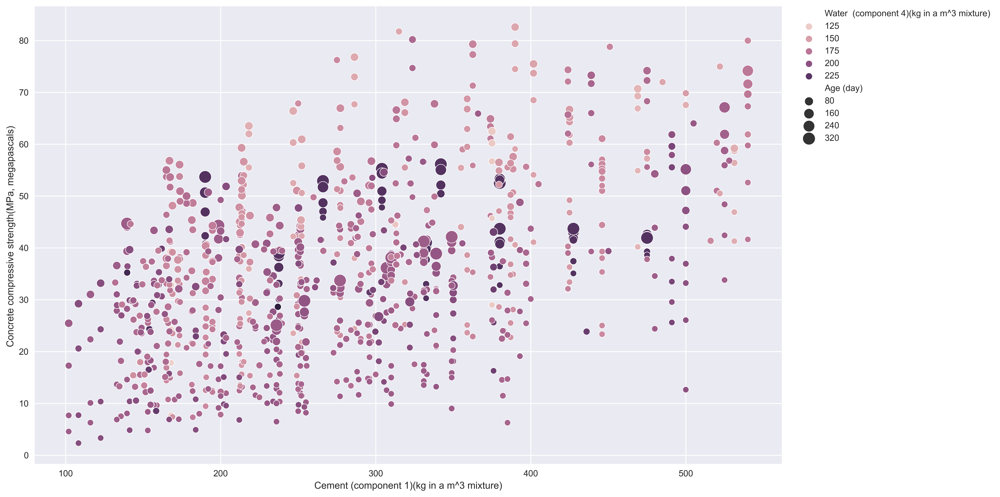

In [29]:
plt.style.use('seaborn')
plt.figure(figsize=(16, 8), dpi=500)
sns.scatterplot(data=df, x=df.columns[0], y = df.columns[-1], size='Age (day)', hue=df.columns[3], sizes= (50,200)) #All the dots looks same so have to use sizes to define the size range to examine the relation
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0) # This line is used to change the position of legends 
plt.tight_layout()# The function to make the large scale plot congestive

# Major Things to notice in above plot
> ### * The above plot shows that strength can be higher when age increase but not always
> ### * The more water it requires when age increases easily seems by the scatter dot color
> ### * The strength also increase when cement increase
> ### * The less water used also shows in good concreate strength

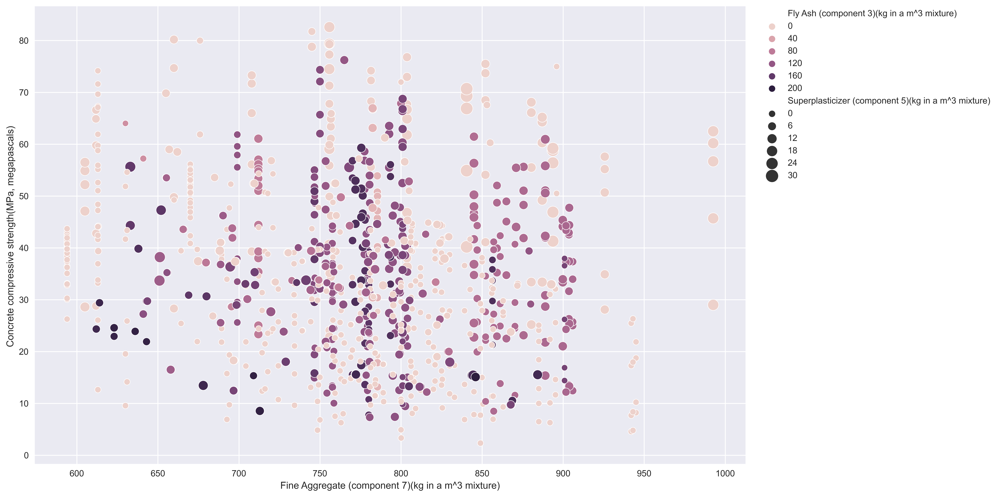

In [30]:
plt.style.use('seaborn')
plt.figure(figsize=(16, 8), dpi=500)
sns.scatterplot(data=df, x = df.columns[-3], y = df.columns[-1], size=df.columns[4], hue=df.columns[2], sizes=(50, 200))
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0) # This line is used to change the position of legends 
plt.tight_layout()

# Major Things to notice in above plot
> ### * The above plot shows that when Fly ash increase then concreate strength decrease and vice versa
> ### * Also there it seems when the strength increase super plasticizer increase and vice versa

In [9]:
print(f"Correlation of features with {df.columns[-1]}")
df.iloc[:,0:-1].corrwith(df[df.columns[-1]])

Correlation of features with Concrete compressive strength(MPa, megapascals) 


Cement (component 1)(kg in a m^3 mixture)                0.497832
Blast Furnace Slag (component 2)(kg in a m^3 mixture)    0.134829
Fly Ash (component 3)(kg in a m^3 mixture)              -0.105755
Water  (component 4)(kg in a m^3 mixture)               -0.289633
Superplasticizer (component 5)(kg in a m^3 mixture)      0.366079
Coarse Aggregate  (component 6)(kg in a m^3 mixture)    -0.164935
Fine Aggregate (component 7)(kg in a m^3 mixture)       -0.167241
Age (day)                                                0.328873
dtype: float64

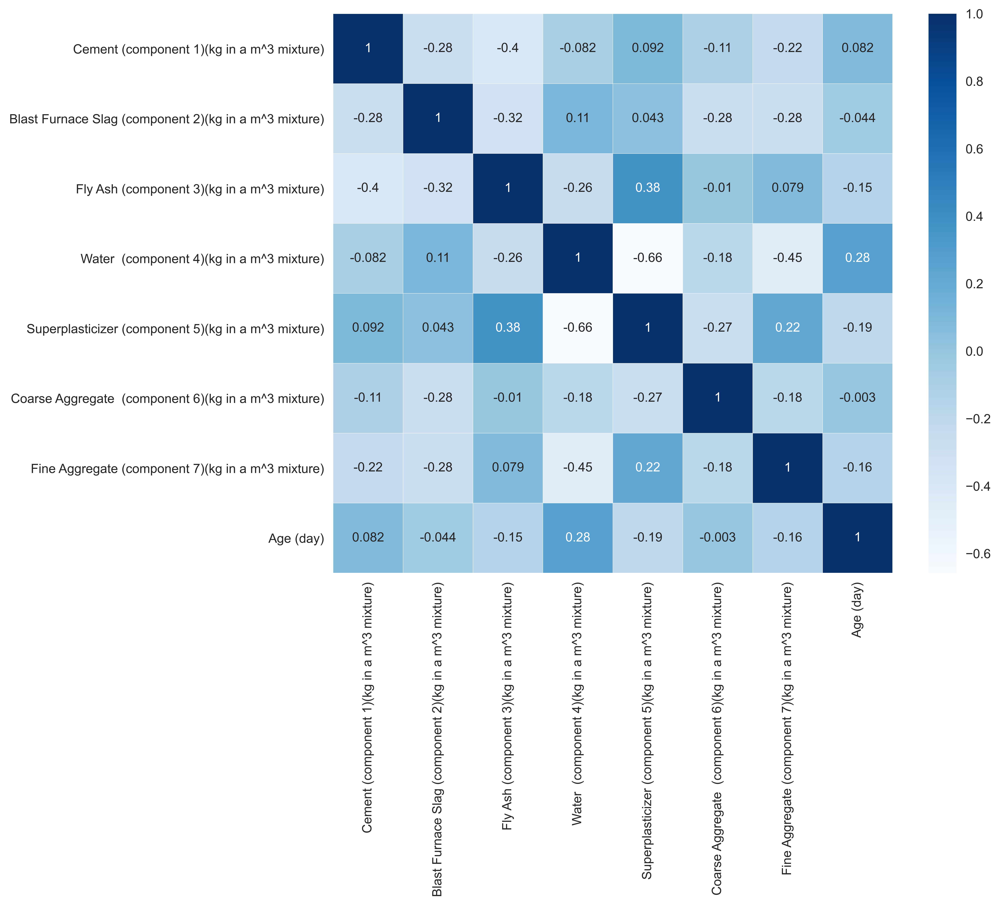

In [32]:
plt.style.use('seaborn')
plt.figure(figsize=(10,8),dpi=600)
sns.heatmap(df.iloc[:,0:-1].corr(), linewidth=0.2,annot=True,cmap='Blues',square=True)
plt.show()

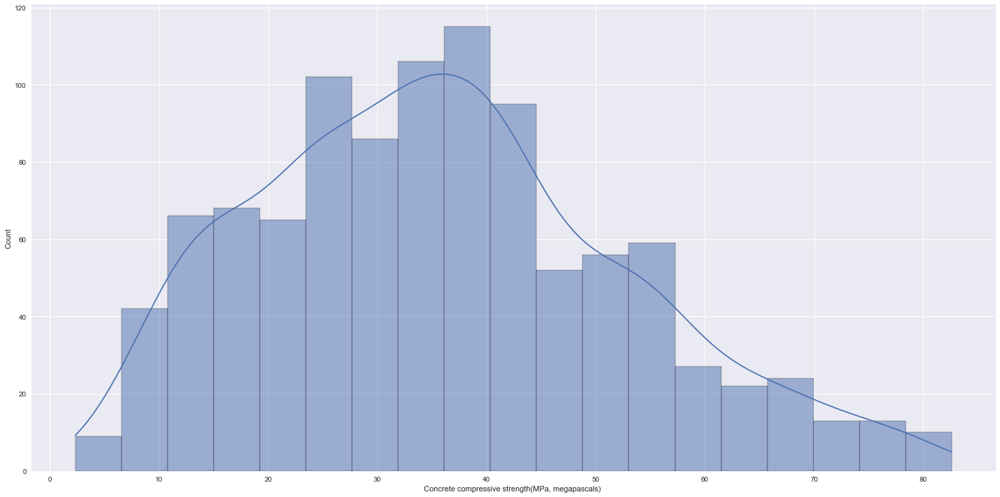

In [31]:
# Mostly are in around 40-45 are strongest
plt.style.use('seaborn')
sns.displot(df['Concrete compressive strength(MPa, megapascals) '],height=10, aspect=2, kde=True)

Text(0.5, 1.0, 'Before Scaling')

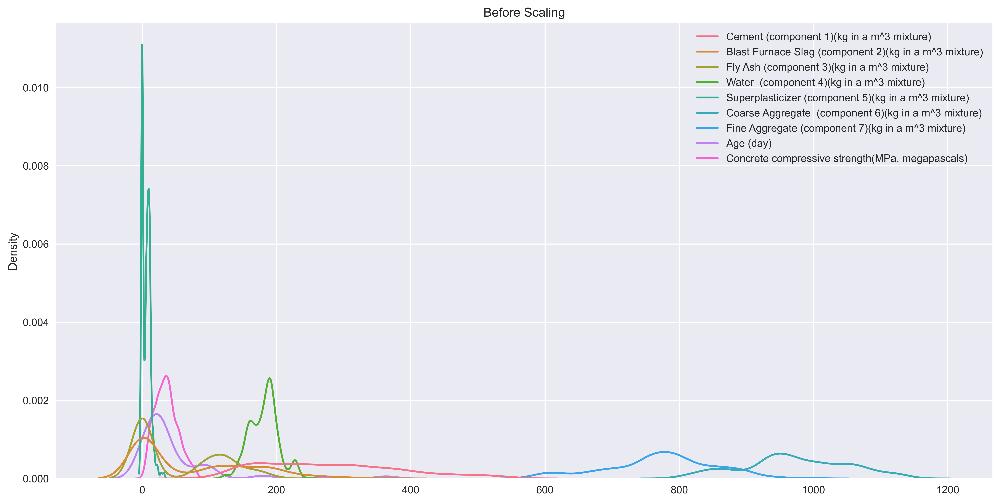

In [12]:
plt.style.use('seaborn')
plt.figure(figsize=(16,8),dpi=500)
sns.kdeplot(data=df)
plt.title("Before Scaling")

In [13]:
from sklearn.preprocessing import StandardScaler

In [14]:
ss = StandardScaler()
df_scaled = pd.DataFrame(ss.fit_transform(df),columns = df.columns)
df_scaled.head()

,Cement (component 1)(kg in a m^3 mixture),Blast Furnace Slag (component 2)(kg in a m^3 mixture),Fly Ash (component 3)(kg in a m^3 mixture),Water (component 4)(kg in a m^3 mixture),Superplasticizer (component 5)(kg in a m^3 mixture),Coarse Aggregate (component 6)(kg in a m^3 mixture),Fine Aggregate (component 7)(kg in a m^3 mixture),Age (day),"Concrete compressive strength(MPa, megapascals)"
0,2.477915,-0.856888,-0.847144,-0.916764,-0.620448,0.863154,-1.217670,-0.279733,2.645408
1,2.477915,-0.856888,-0.847144,-0.916764,-0.620448,1.056164,-1.217670,-0.279733,1.561421
2,0.491425,0.795526,-0.847144,2.175461,-1.039143,-0.526517,-2.240917,3.553066,0.266627
3,0.491425,0.795526,-0.847144,2.175461,-1.039143,-0.526517,-2.240917,5.057677,0.313340
4,-0.790459,0.678408,-0.847144,0.488793,-1.039143,0.070527,0.647884,4.978487,0.507979


Text(0.5, 1.0, 'After Scaling')

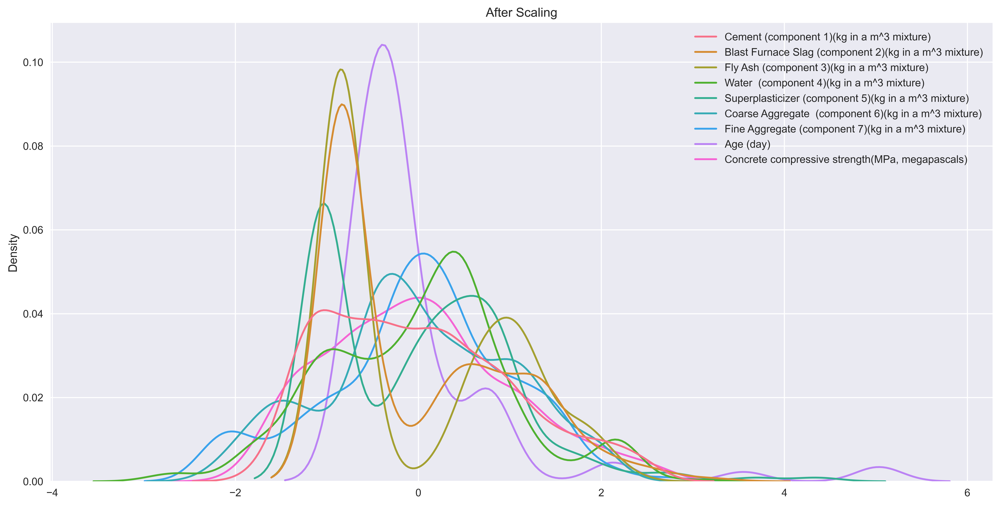

In [15]:
plt.style.use('seaborn')
plt.figure(figsize=(16,8),dpi=500)
sns.kdeplot(data=df_scaled)
plt.title("After Scaling")

#### Here all the values are standarized using standard scaler, which is easy to pass in our model and since all the columns are near to each other they all are in normalized order

# Splitting the data into features and target

### Note.
> ### I split the data here in 70 for training and 30 for testing then I split the training data into validation at the time of training

In [16]:
X = df_scaled.iloc[:,0:-1].values #Features Select All columns except the last one
y = df_scaled.iloc[:,-1:].values #Target Select only last column

In [17]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3)

In [18]:
print("Training Data Shapes:\nIn X_train = {} \nIn y_test = {}".format(X_train.shape,y_train.shape))

Training Data Shapes:
In X_train = (721, 8) 
In y_test = (721, 1)


# Model 

In [19]:
model = models.Sequential([tf.keras.layers.Flatten(),
           layers.Dense(10, activation='relu'),
           layers.Dense(8),
           layers.Dense(6),
           layers.Dense(1, activation='linear')])#With linear the loss is less than 20% while with relu loss is more than 30% so after experimenting I used linear at output layer

## Compiling

In [33]:
model.compile(optimizer='RMSprop',metrics=['mae'], loss = ['mse'])

## Training

In [21]:
history = model.fit(X_train,y_train, epochs = 100, validation_split= 0.2)

Epoch 1/100
18/18 [==============================] - 1s 37ms/step - loss: 1.6855 - mae: 1.0110 - val_loss: 1.0186 - val_mae: 0.8013
Epoch 2/100
18/18 [==============================] - 0s 2ms/step - loss: 1.1391 - mae: 0.8480 - val_loss: 0.7775 - val_mae: 0.7071
Epoch 3/100
18/18 [==============================] - 0s 2ms/step - loss: 0.7596 - mae: 0.6966 - val_loss: 0.6242 - val_mae: 0.6393
Epoch 4/100
18/18 [==============================] - 0s 2ms/step - loss: 0.6598 - mae: 0.6624 - val_loss: 0.5219 - val_mae: 0.5859
Epoch 5/100
18/18 [==============================] - 0s 2ms/step - loss: 0.4835 - mae: 0.5658 - val_loss: 0.4508 - val_mae: 0.5423
Epoch 6/100
18/18 [==============================] - 0s 2ms/step - loss: 0.4654 - mae: 0.5514 - val_loss: 0.4076 - val_mae: 0.5143
Epoch 7/100
18/18 [==============================] - 0s 2ms/step - loss: 0.4402 - mae: 0.5369 - val_loss: 0.3792 - val_mae: 0.4957
Epoch 8/100
18/18 [==============================] - 0s 2ms/step - loss: 0.4112 - 

## Evaluation 

In [22]:
evaluation = model.evaluate(X_test,y_test)
evaluation 

10/10 [==============================] - 0s 443us/step - loss: 0.1734 - mae: 0.3016


[0.17343056201934814, 0.30163997411727905]

In [23]:
loss, error = evaluation

In [24]:
accuracy = 100 - loss*100
print("Accuracy = {} %\nLoss = {} %".format(accuracy, loss*100))

Accuracy = 82.65694379806519 %
Loss = 17.343056201934814 %


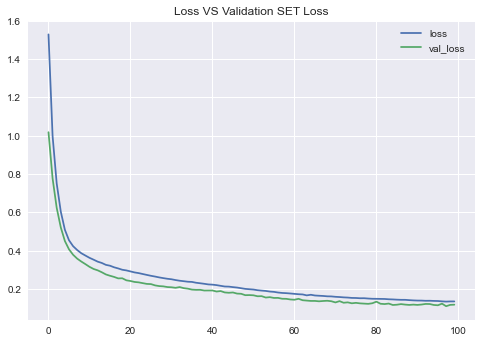

In [25]:
plt.style.use('seaborn')
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss VS Validation SET Loss")
plt.show()

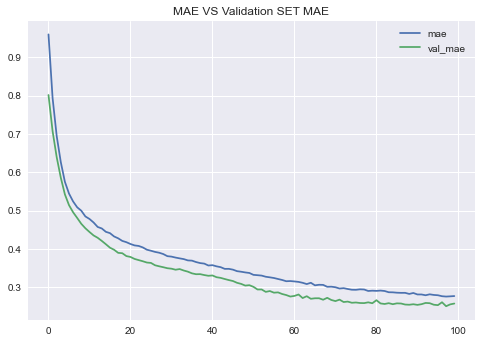

In [26]:
pd.DataFrame(history.history)[['mae','val_mae']].plot()
plt.title("MAE VS Validation SET MAE")
plt.show()

In [27]:
y_pred = model.predict(X_test)

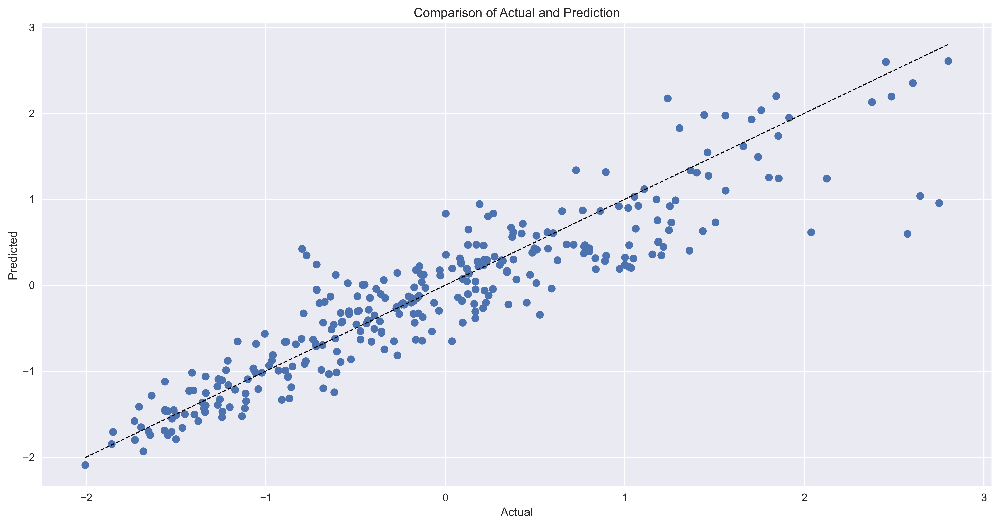

In [36]:
plt.figure(figsize=(16,8), dpi=500)
plt.title("Comparison of Actual and Prediction")
plt.scatter(x = y_test, y = y_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw = 1) # To plot the line from min to max 
plt.xlabel("Actual")
plt.ylabel('Predicted')
plt.show()